# Train UNet on Watershed Boundaries

In [1]:

import skimage, scipy

import matplotlib.pyplot as plt

import sys; sys.path += [".."]  # NOTE find shared modules

from util.preprocess import *
from util.plot import *
from util.onnx import *

import segmentation_models_pytorch as smp
import torch

def norm(x): return (x - x.min()) / (x.max() - x.min())

CUDA = torch.cuda.is_available()
device = torch.device('cuda:0' if CUDA else 'cpu')

print(f"Device: {device}")

Device: cuda:0


In [2]:

dataset = 'third'
imgid = '1'

SLICE = False if CUDA else 512

RGB = norm(skimage.io.imread(f"../data/{dataset}/{imgid}.jpg").astype(np.float32))
if SLICE: RGB = RGB[:SLICE, :SLICE]

# green channel turned out to be the sharpest
G = RGB[..., 1]


RGB2 = norm(skimage.io.imread(f"../data/{dataset}/2.jpg").astype(np.float32))
if SLICE: RGB2 = RGB2[:SLICE, :SLICE]
G2 = RGB2[..., 1]

pos = preprocess_point("../data/third/points.json").astype(int)
if SLICE: pos = np.array([[x,y] for x,y in pos if 0 <= x < SLICE and 0 <= y < SLICE])

# remove double points in pos
pos = np.unique(pos, axis=0)
outside_points = len(pos) 

# remove points outside of the image
pos = np.array([[x,y] for x,y in pos if 0 <= y < G.shape[0] and 0 <= x < G.shape[1]])
outside_points -= len(pos)

#ax = plot_image(G, title=f"Input image (green channel): {dataset}/{imgid}", scale=2.5)
# ax.scatter(pos[:,0], pos[:,1], c='r', s=8**2, marker='o', label="Target points")

print(f"Removed {outside_points} points from outside of the image")

Removed 0 points from outside of the image


2024-03-31 10:07:58.251685830 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 34976, index: 4, mask: {5, 29, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.
2024-03-31 10:07:58.251668480 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 34974, index: 2, mask: {3, 27, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.
2024-03-31 10:07:58.251663107 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 34975, index: 3, mask: {4, 28, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.
2024-03-31 10:07:58.251669547 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 34973, index: 1, mask: {2, 26, }, error code: 22 error msg: Invalid argument. Speci

<Axes: title={'center': 'Mask (fake phase reconstruction, threshold 0.01)'}>

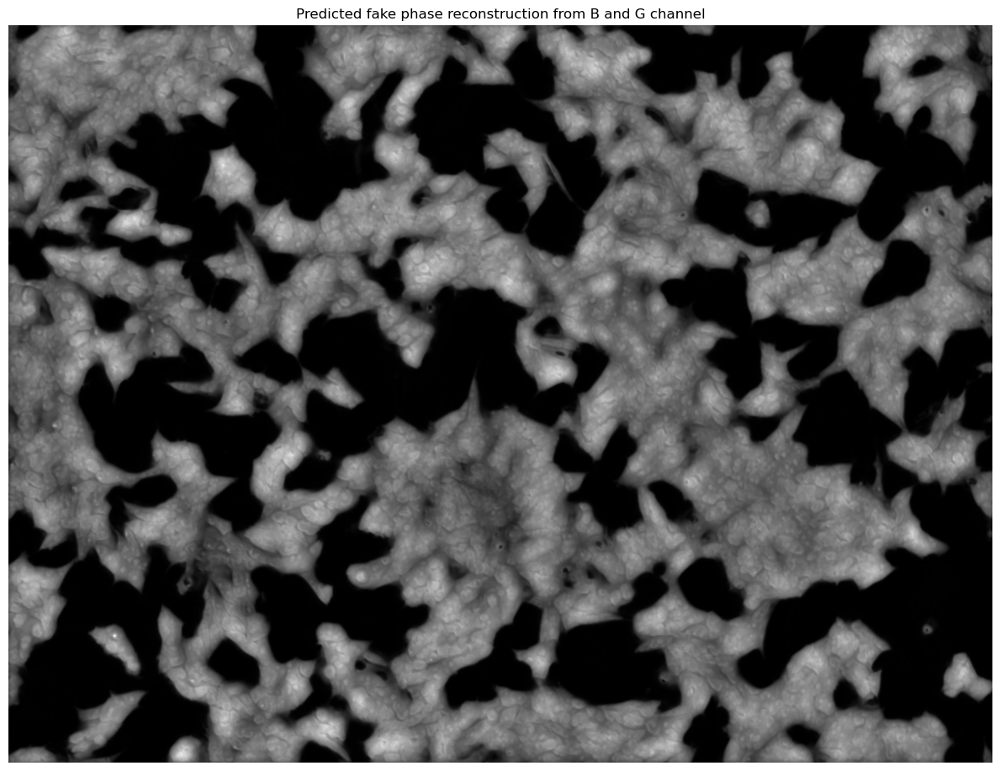

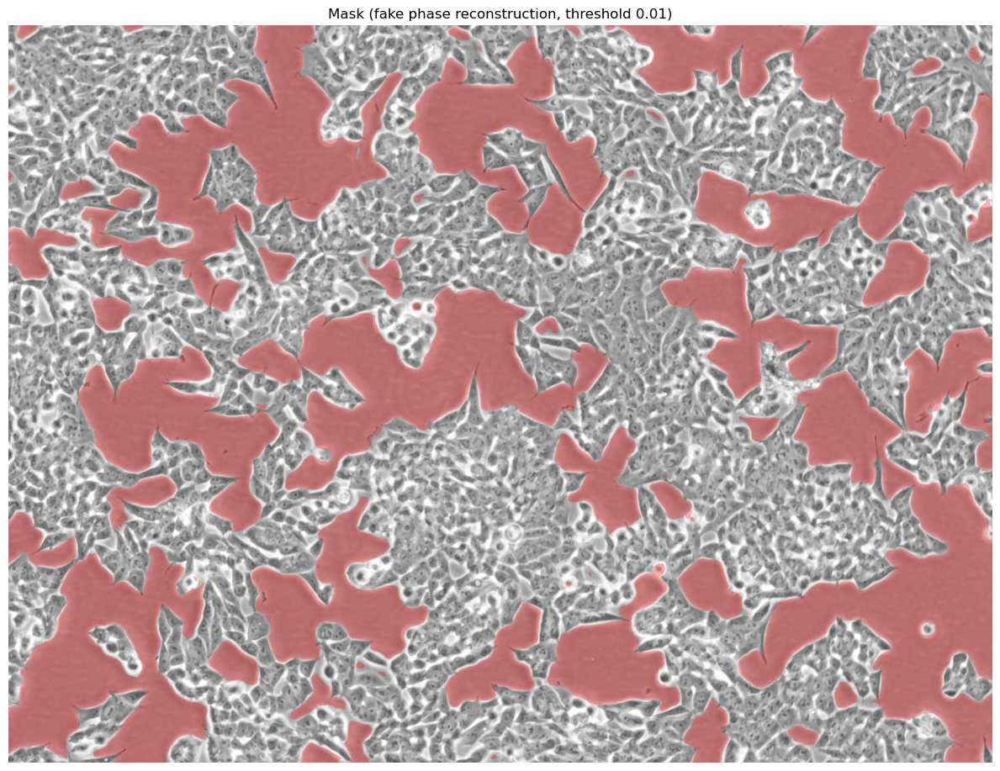

In [3]:

bg_mask_predictor = get_onnx("../data/phaseimaging-combo-v3.onnx")

def bg_mask(thresh):

  input = np.expand_dims(np.transpose(RGB[..., [2, 1]], (2, 0, 1)), axis=0)
  pred = bg_mask_predictor(input)

  mask = (pred[0, 0] > thresh).reshape(G.shape)

  return pred[0,0], mask

thresh = 0.01
fake_phase, bg_mask = bg_mask(thresh=thresh)
plot_image(
  fake_phase, title=f"Predicted fake phase reconstruction from B and G channel", scale=2
)
plot_image(
  skimage.color.label2rgb(1 - bg_mask, RGB, bg_color=None, alpha=0.3),
  title=f"Mask (fake phase reconstruction, threshold {thresh:.2f})", scale=2
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


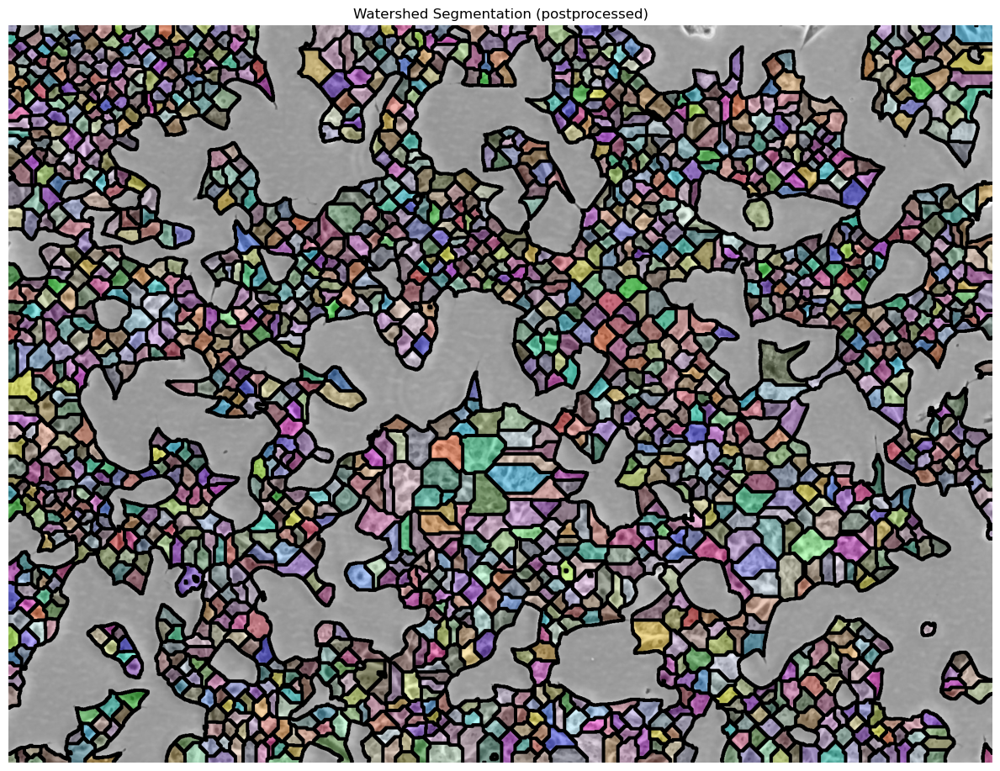

In [4]:

mark = np.zeros(RGB.shape[:2], dtype=int)
mark[pos[:, 1], pos[:, 0]] = np.arange(len(pos)) + 1  # pay attention to this weird swap
# mark[neg[:,0], neg[:,1]] = -1

ws = skimage.segmentation.watershed(bg_mask, markers=mark, mask=bg_mask)   # THIS STEP use better image to make watershed not just mask (however with normal image the watershed is bad)
#ws = skimage.morphology.remove_small_holes  (ws, 20)
ws = skimage.morphology.remove_small_objects(ws, 20)

bounds = skimage.segmentation.find_boundaries(ws, mode="thick")

bounds = scipy.ndimage.maximum_filter(bounds, size=6)


plot = skimage.color.label2rgb(ws, G, bg_color=None, alpha=0.4, colors=mk_colors(pos))
plot = skimage.color.label2rgb(bounds, plot, bg_color=None, alpha=1, colors=['black'], saturation=1)
ax = plot_image(plot, title="Watershed Segmentation (postprocessed)", scale=2)
#plot_points(pos, ax, c='k');
del plot

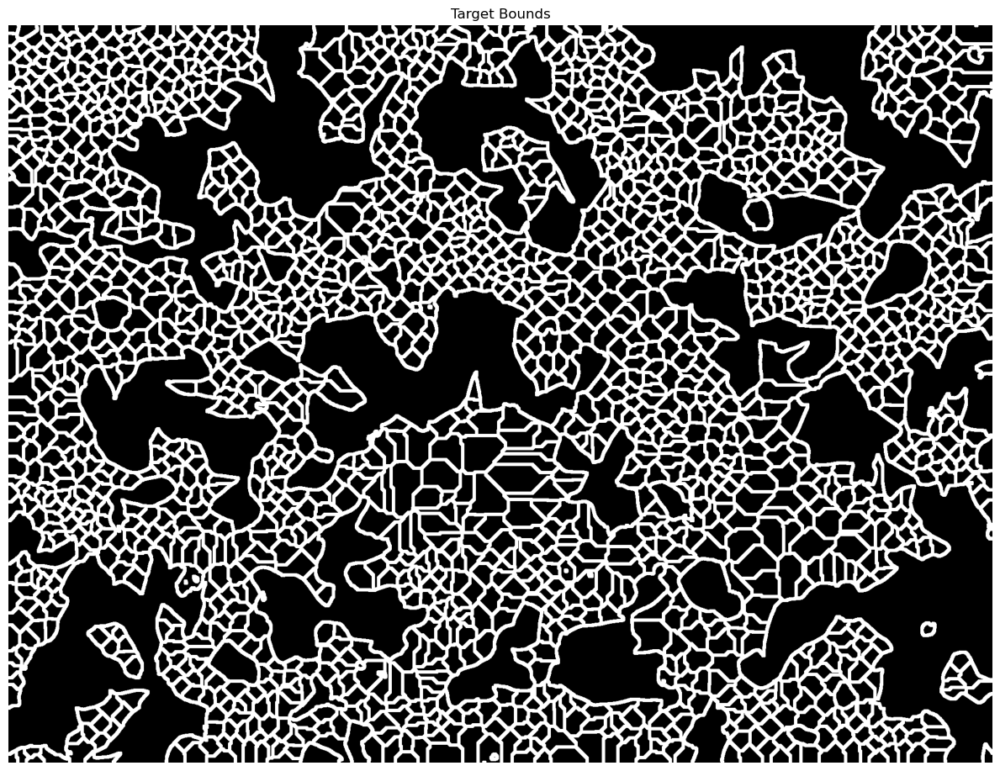

In [5]:
# turn the ws segmentation into a mask with 1 for background, 2 for any cell instance and 3 for the boundaries
target = np.zeros((*ws.shape, 1))
target[..., 0] = bounds


plot_image(target[...,0], title=f"Target Bounds", scale=2)


# target = G; print("NOTE: using G channel as target") # NOTE change this back TODO
target = torch.from_numpy(np.transpose(target, (2, 0, 1))).unsqueeze(0).float().to(device)  # NOTE that for multiple channels you have to replace the first unsqueeze(0) with permute(2,0,1)
input = torch.from_numpy(np.transpose(RGB, (2, 0, 1))).unsqueeze(0).float().to(device)
input2 = torch.from_numpy(np.transpose(RGB2, (2, 0, 1))).unsqueeze(0).float().to(device)

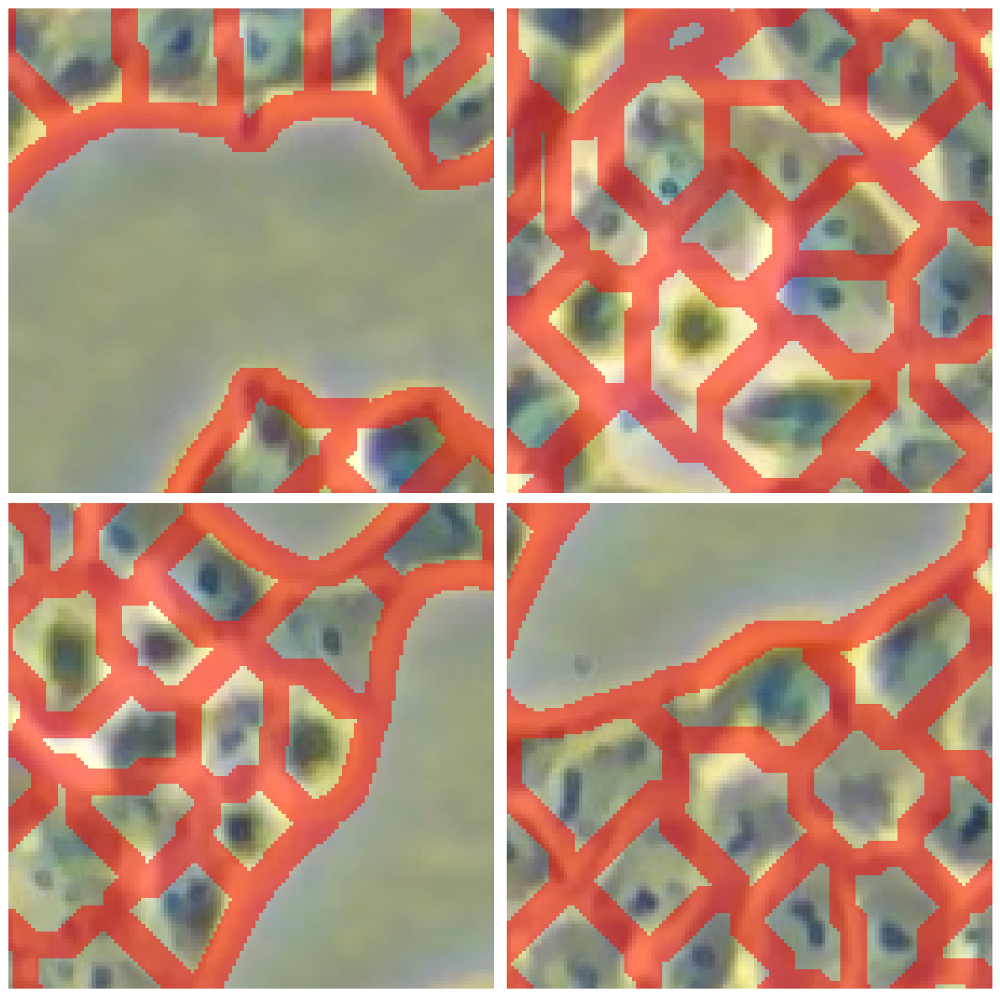

In [6]:

def sample_tile(X, Y, size):
  """Sample a tile of size `size` from the image X and the mask Y"""
  c,h,w = X.shape[-3:]
  x = np.random.randint(0, w - size)
  y = np.random.randint(0, h - size)
  return X[..., y:y+size, x:x+size], Y[..., y:y+size, x:x+size]

def batch_tiles(X, Y, size, n):
  """Sample n tiles of size `size` from the image X and the mask Y"""
  Xs, Ys = zip(*[sample_tile(X, Y, size) for _ in range(n)])
  return torch.stack(Xs), torch.stack(Ys)


# plot a few sampled tiles
fig, axs = mk_fig(2,2, scale=1, shape=(128,128))
for ax in axs:
  X,Y = sample_tile(input, target, 128)

  X,Y = X[0].cpu().numpy(), Y[0].cpu().numpy()
  #y = np.argmax(Y, axis=0)

  heat = norm(np.stack([Y[0],Z:=np.zeros_like(Y[0]),Z,Y[0]*0.5], axis=-1))
  
  plot_image(np.transpose(X, (1,2,0)), ax=ax)
  plot_image(heat, ax=ax)

In [7]:
model = smp.Unet(
  encoder_name="resnet34",
  encoder_weights='imagenet',
  in_channels=3,
  classes=1,
  activation='sigmoid',
)
model.to(device)

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

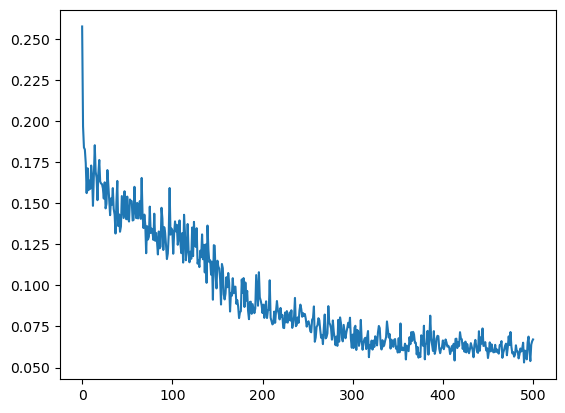

In [8]:

# train the model in a simple pytorch loop
LOG = []

n_epochs = 501 if CUDA else 51
batch_size = 32 if CUDA else 8

optimizer = torch.optim.Adam(model.parameters(), lr=2e-3)
criterion = torch.nn.MSELoss()
#scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=8, verbose=True)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=150, gamma=0.2)

model.train()

for epoch in range(n_epochs):
  model.train()
  optimizer.zero_grad()

  X,Y = batch_tiles(input[0], target[0], 128, batch_size)

  pred = model(X)
  loss = criterion(pred, Y)

  loss.backward()
  optimizer.step()

  if epoch % 1 == 0:
    with torch.no_grad():
      model.eval()
      pred = model(input)
      pred2 = model(input2)

      LOG.append(dict(
        epoch = epoch,
        loss = loss.item(),
        lr = optimizer.param_groups[0]['lr'],
        pred = pred[0].detach().cpu().numpy(),
        pred2 = pred2[0].detach().cpu().numpy(),
      ))

  
  scheduler.step()#(loss.item())

losses = np.array([x['loss'] for x in LOG])
plt.plot(losses)

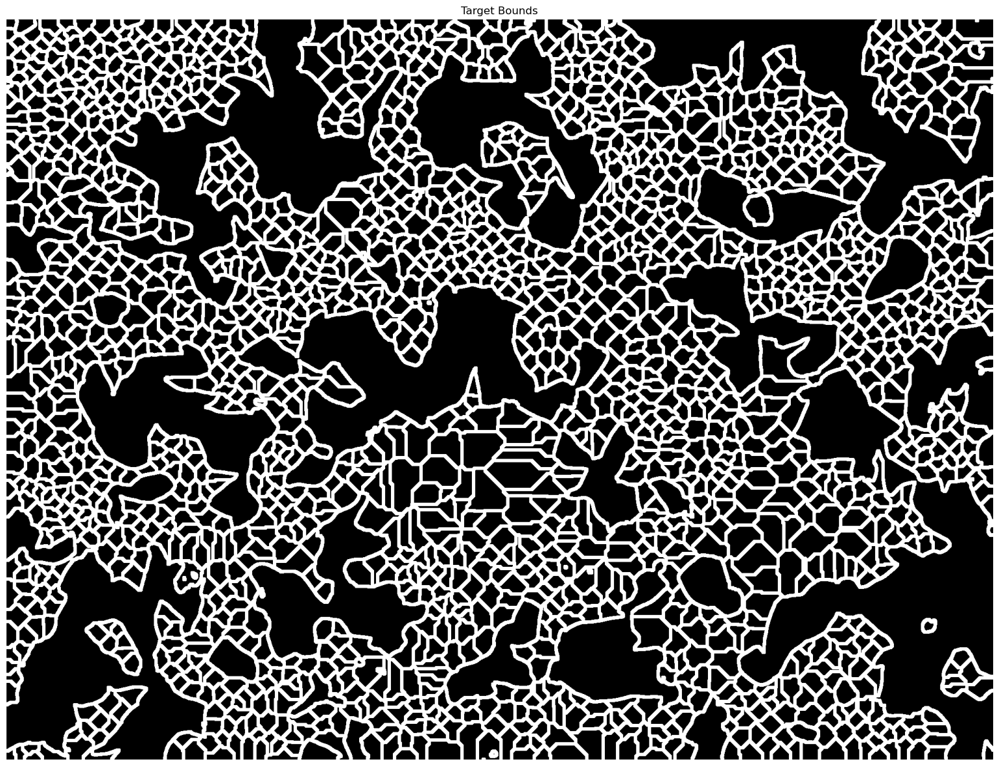

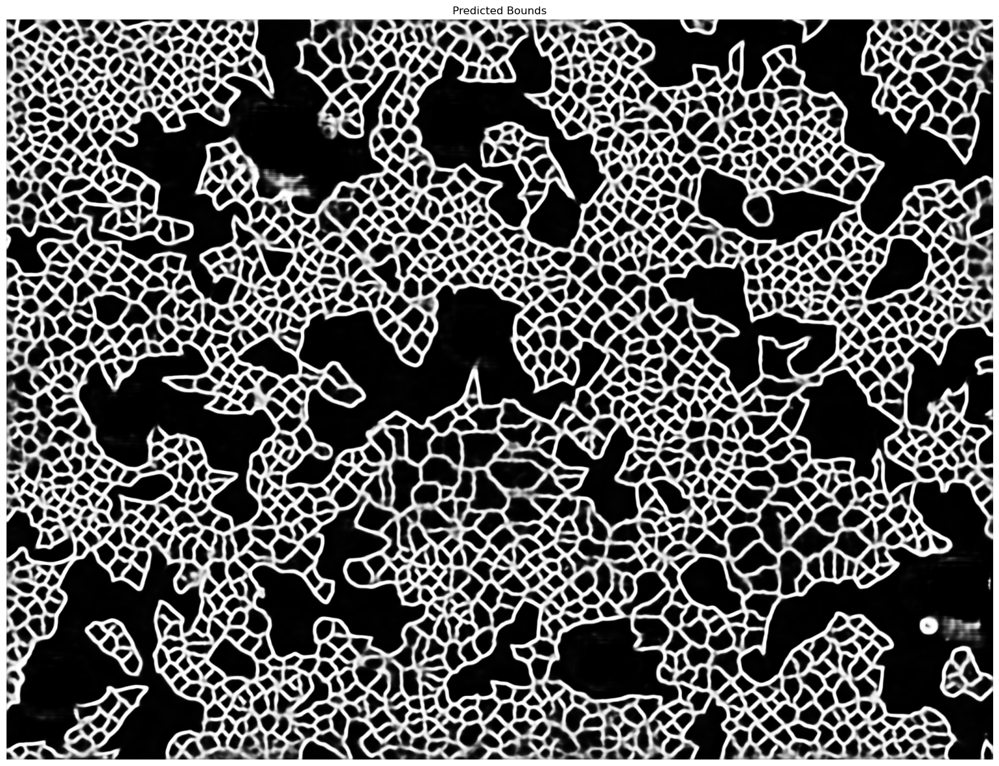

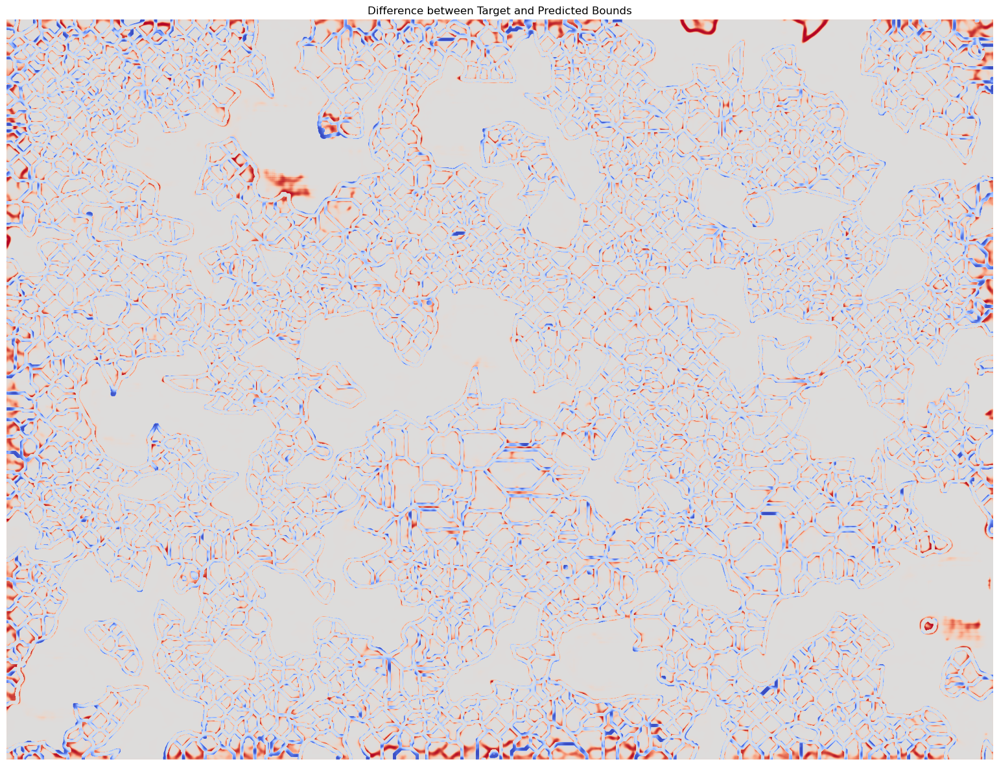

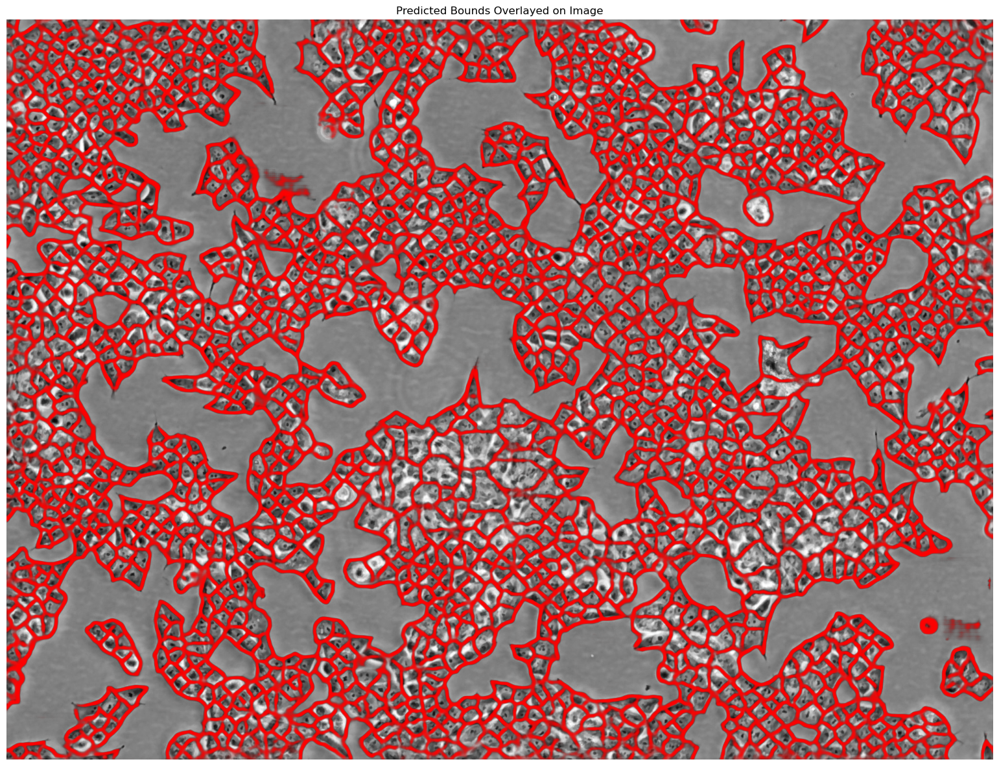

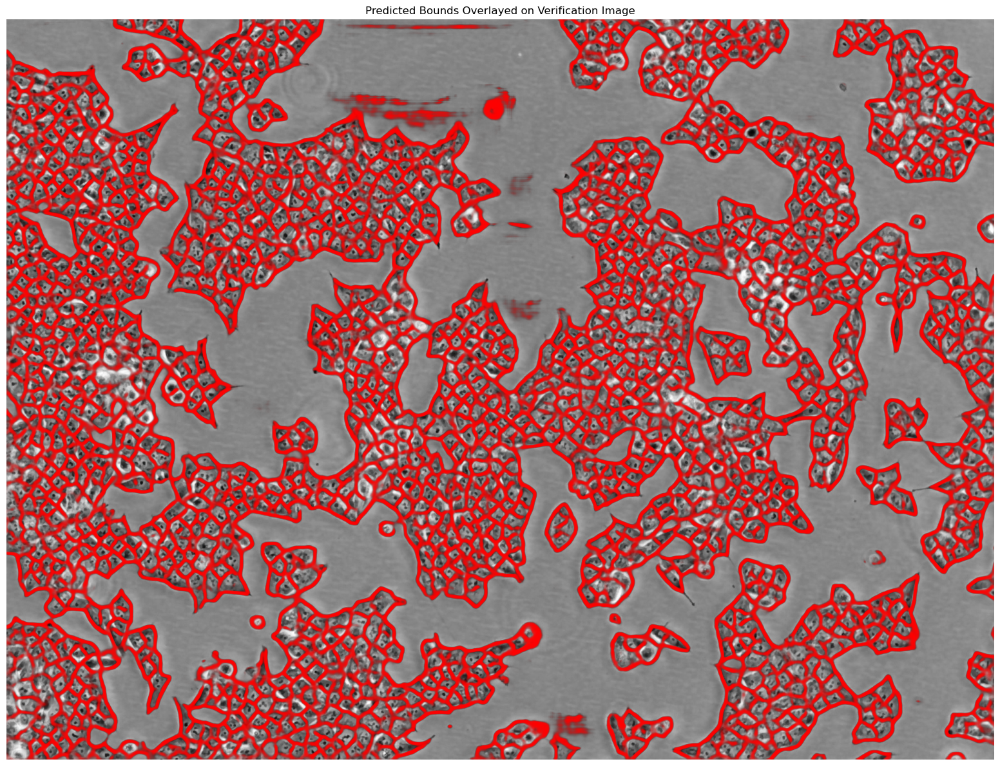

In [9]:

model.eval()
with torch.no_grad():
  pred = model(input).detach().cpu().numpy()[0][0]
  pred2 = model(input2).detach().cpu().numpy()[0][0]


axs = []
for i in range(5):
  axs.append(mk_fig(1,1, scale=2, shape=target.shape[-2:])[1])

targ = target[0,0].detach().cpu().numpy()
inp = input[0,1].detach().cpu().numpy()
inp2 = input2[0,1].detach().cpu().numpy()

plot_points = lambda ax: ax.scatter(pos[:,1], pos[:,0], c='magenta', s=8**2, marker='+', label="Target points")

plot_image(targ, ax=axs[0], title=f"Target Bounds")
plot_image(pred, ax=axs[1], title=f"Predicted Bounds")

title = f"Difference between Target and Predicted Bounds"
plot_image(pred-targ, ax=axs[2], title=title, cmap='coolwarm')

title = F"Predicted Bounds Overlayed on Image"
heat = norm(np.stack([pred, Z:=np.zeros_like(pred),Z,pred], axis=-1))
plot_image(inp, ax=axs[3], title=title)
plot_image(heat, ax=axs[3], title=title)

title = F"Predicted Bounds Overlayed on Verification Image"
heat = norm(np.stack([pred2, Z:=np.zeros_like(pred2),Z,pred2], axis=-1))
plot_image(inp2, ax=axs[4], title=title)
plot_image(heat, ax=axs[4], title=title)


# save the two predictions as npy arrays 
np.save('../runs/smp/unet-watershed/targ.npy', targ)
np.save('../runs/smp/unet-watershed/pred.npy', pred)
np.save('../runs/smp/unet-watershed/pred2.npy', pred2)

#[plot_points(ax) for ax in axs[1:4]];